# Dataset Exploration: MAPS Pre-Split vs Random Split

**Goal:** Understand why MAPS's pre-defined train/valid split yields ~90% weighted F1,
while our random 80/20 split yields lower performance.

We compare:
1. **MAPS Split** — `maps_train.csv` + `maps_valid.csv` (the exact files MAPS shipped)
2. **Random Split** — 80/20 random split (seed=42) from the combined dataset

We look at:
- Class distribution differences
- Per-feature (marker) distribution differences between train and valid
- Statistical divergence between the two splitting strategies

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from scipy import stats

sns.set_theme(style="whitegrid", font_scale=1.1)
plt.rcParams['figure.dpi'] = 120

print("Libraries loaded.")

Libraries loaded.


## 1. Load Data and Create Both Splits

In [32]:
# ====================================================================
# LOAD MAPS PRE-SPLIT DATA
# ====================================================================
maps_train = pd.read_csv("maps_train.csv")
maps_valid = pd.read_csv("maps_valid.csv")

print(f"MAPS Split  ->  Train: {len(maps_train):,}  |  Valid: {len(maps_valid):,}")
print(f"Train ratio: {len(maps_train)/(len(maps_train)+len(maps_valid)):.1%}")

# ====================================================================
# CREATE RANDOM 80/20 SPLIT (same as our earlier experiments)
# ====================================================================
combined = pd.concat([maps_train, maps_valid], ignore_index=True)
print(f"\nCombined dataset: {len(combined):,} cells x {combined.shape[1]} columns")

np.random.seed(42)
perm = np.random.permutation(len(combined))
n_train = int(0.8 * len(combined))

rand_train = combined.iloc[perm[:n_train]].reset_index(drop=True)
rand_valid = combined.iloc[perm[n_train:]].reset_index(drop=True)

print(f"Random Split ->  Train: {len(rand_train):,}  |  Valid: {len(rand_valid):,}")

# Column definitions
MARKER_COLS = [
    'BCL.2', 'CCR6', 'CD11b', 'CD11c', 'CD15', 'CD16', 'CD162', 'CD163',
    'CD2', 'CD20', 'CD206', 'CD25', 'CD30', 'CD31', 'CD4', 'CD44',
    'CD45', 'CD45RA', 'CD45RO', 'CD5', 'CD56', 'CD57', 'CD68', 'CD69',
    'CD7', 'CD8', 'Collagen.4', 'Cytokeratin', 'DAPI.01', 'EGFR',
    'FoxP3', 'Granzyme.B', 'HLA.DR', 'IDO.1', 'LAG.3', 'MCT', 'MMP.9',
    'MUC.1', 'PD.1', 'PD.L1', 'Podoplanin', 'T.bet', 'TCR.g.d', 'TCRb',
    'Tim.3', 'VISA', 'Vimentin', 'a.SMA', 'b.Catenin'
]
FEATURE_COLS = MARKER_COLS + ['cellSize']
CLASS_NAMES = ['B', 'CD4', 'CD8', 'DC', 'Endothelial', 'Epithelial',
               'Lymphatic', 'M1', 'M2', 'Mast', 'Monocyte', 'NK',
               'Neutrophil', 'Other', 'TReg', 'Tumor']

MAPS Split  ->  Train: 114,984  |  Valid: 28,746
Train ratio: 80.0%

Combined dataset: 143,730 cells x 51 columns
Random Split ->  Train: 114,984  |  Valid: 28,746


## 2. Class Distribution Comparison

Side-by-side comparison of how many cells of each type end up in train vs valid
for each splitting strategy.

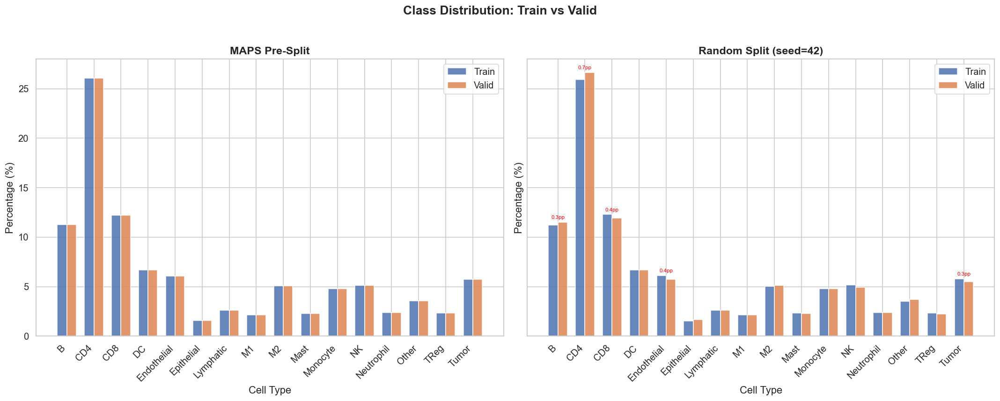

In [33]:
# ====================================================================
# PLOT 1: Class distribution — MAPS split vs Random split
# ====================================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)

for ax, title, tr, va in [
    (axes[0], "MAPS Pre-Split", maps_train, maps_valid),
    (axes[1], "Random Split (seed=42)", rand_train, rand_valid),
]:
    # Compute proportions per class
    tr_counts = tr['cell_label'].value_counts().sort_index()
    va_counts = va['cell_label'].value_counts().sort_index()
    tr_pct = 100 * tr_counts / len(tr)
    va_pct = 100 * va_counts / len(va)

    x = np.arange(len(CLASS_NAMES))
    w = 0.35
    bars1 = ax.bar(x - w/2, tr_pct.values, w, label='Train', color='#4C72B0', alpha=0.85)
    bars2 = ax.bar(x + w/2, va_pct.values, w, label='Valid', color='#DD8452', alpha=0.85)

    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel("Cell Type")
    ax.set_ylabel("Percentage (%)")
    ax.set_xticks(x)
    ax.set_xticklabels(CLASS_NAMES, rotation=45, ha='right')
    ax.legend()

    # Annotate the absolute difference on top
    for i in range(len(CLASS_NAMES)):
        diff = abs(tr_pct.values[i] - va_pct.values[i])
        if diff > 0.3:  # only annotate meaningful differences
            ax.annotate(f"{diff:.1f}pp",
                        xy=(x[i], max(tr_pct.values[i], va_pct.values[i]) + 0.3),
                        ha='center', fontsize=7, color='red')

fig.suptitle("Class Distribution: Train vs Valid", fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

C:\Users\mahee\AppData\Local\Temp\ipykernel_25424\2840609121.py:31: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


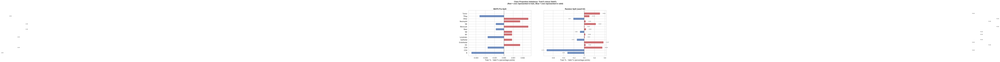

In [34]:
# ====================================================================
# PLOT 2: Detailed class proportion difference (train% - valid%)
# Shows which classes are OVER-represented in train vs valid
# ====================================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

for ax, title, tr, va in [
    (axes[0], "MAPS Pre-Split", maps_train, maps_valid),
    (axes[1], "Random Split (seed=42)", rand_train, rand_valid),
]:
    tr_pct = 100 * tr['cell_label'].value_counts().sort_index() / len(tr)
    va_pct = 100 * va['cell_label'].value_counts().sort_index() / len(va)
    diff = tr_pct.values - va_pct.values

    colors = ['#C44E52' if d > 0 else '#4C72B0' for d in diff]
    bars = ax.barh(np.arange(len(CLASS_NAMES)), diff, color=colors, alpha=0.8)
    ax.set_yticks(np.arange(len(CLASS_NAMES)))
    ax.set_yticklabels(CLASS_NAMES)
    ax.set_xlabel("Train % - Valid % (percentage points)")
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.axvline(0, color='black', linewidth=0.8)

    # Annotate values
    for i, d in enumerate(diff):
        ax.text(d + (0.05 if d >= 0 else -0.05), i, f"{d:+.2f}",
                va='center', ha='left' if d >= 0 else 'right', fontsize=8)

fig.suptitle("Class Proportion Imbalance: Train% minus Valid%\n(Red = over-represented in train, Blue = over-represented in valid)",
             fontsize=13, fontweight='bold', y=1.04)
plt.tight_layout()
plt.show()

## 2b. PCA Projection: Visualizing the Split

Since we don't have X/Y coordinates in the public data, we'll use Principal Component Analysis (PCA)
to project the 50-dimensional feature space into 2D. This lets us see if the Train and Valid
sets occupy the same regions of the feature space.

If MAPS split is random, Train and Valid should overlap perfectly (blue and orange mixed).
If MAPS split is distinct (e.g. spatial regions), we might see separate clusters.

## 2c. Spatial Split Visualization (X/Y Coordinates)

This is the most critical test. If the split is random, the Validation points (orange) should be
scattered uniformly across the tissue alongside Training points (blue).
If the split is spatial (e.g., specific regions held out), we will see large contiguous orange blocks.

We use the spatial feature CSVs `cHL_CODEX_spatial_features/train.csv` and `valid.csv`
which contain the same cells as the standard MAPS split but include `X_cent` and `Y_cent`.

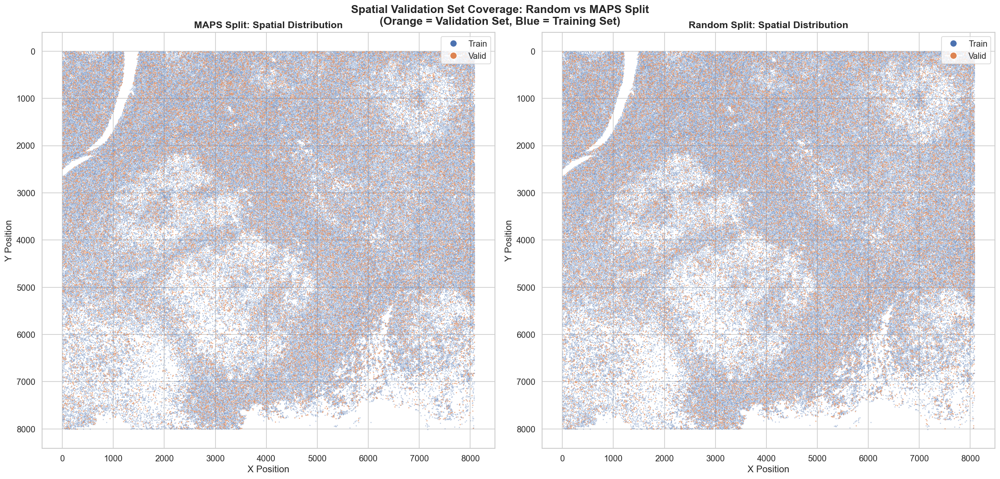

In [35]:
# ====================================================================
# PLOT 2c: Spatial Split Visualization (X/Y)
# Use the "spatial_features" dataset (same split, just includes X/Y)
# ====================================================================

# 1. Load MAPS spatial split
# Note: Paths are relative to notebook location
maps_train_sp = pd.read_csv("cHL_CODEX_spatial_features/train.csv")
maps_valid_sp = pd.read_csv("cHL_CODEX_spatial_features/valid.csv")

# 2. Create Random spatial split
# Combine -> Shuffle -> Split
combined_sp = pd.concat([maps_train_sp, maps_valid_sp], ignore_index=True)

np.random.seed(42)
perm_sp = np.random.permutation(len(combined_sp))
n_train_sp = int(0.8 * len(combined_sp))

rand_train_sp = combined_sp.iloc[perm_sp[:n_train_sp]].reset_index(drop=True)
rand_valid_sp = combined_sp.iloc[perm_sp[n_train_sp:]].reset_index(drop=True)

# Plotting function
def plot_spatial_split(ax, tr_df, va_df, title):
    # Plot Train (blue) first, then Valid (orange) on top
    # Use small markers and high transparency
    ax.scatter(tr_df['X_cent'], tr_df['Y_cent'], c='#4C72B0', s=0.5, alpha=0.3, label='Train')
    ax.scatter(va_df['X_cent'], va_df['Y_cent'], c='#DD8452', s=0.5, alpha=0.6, label='Valid')
    
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")
    # Invert Y axis to match biological convention if needed (often Y runs top-down)
    ax.invert_yaxis()
    
    # Custom legend with larger markers
    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor='#4C72B0', markersize=10, label='Train'),
                       Line2D([0], [0], marker='o', color='w', markerfacecolor='#DD8452', markersize=10, label='Valid')]
    ax.legend(handles=legend_elements, loc='upper right')

# Create plot
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

plot_spatial_split(axes[0], maps_train_sp, maps_valid_sp, "MAPS Split: Spatial Distribution")
plot_spatial_split(axes[1], rand_train_sp, rand_valid_sp, "Random Split: Spatial Distribution")

fig.suptitle("Spatial Validation Set Coverage: Random vs MAPS Split\n(Orange = Validation Set, Blue = Training Set)", 
             fontsize=16, fontweight='bold', y=0.95)
plt.tight_layout()
plt.show()

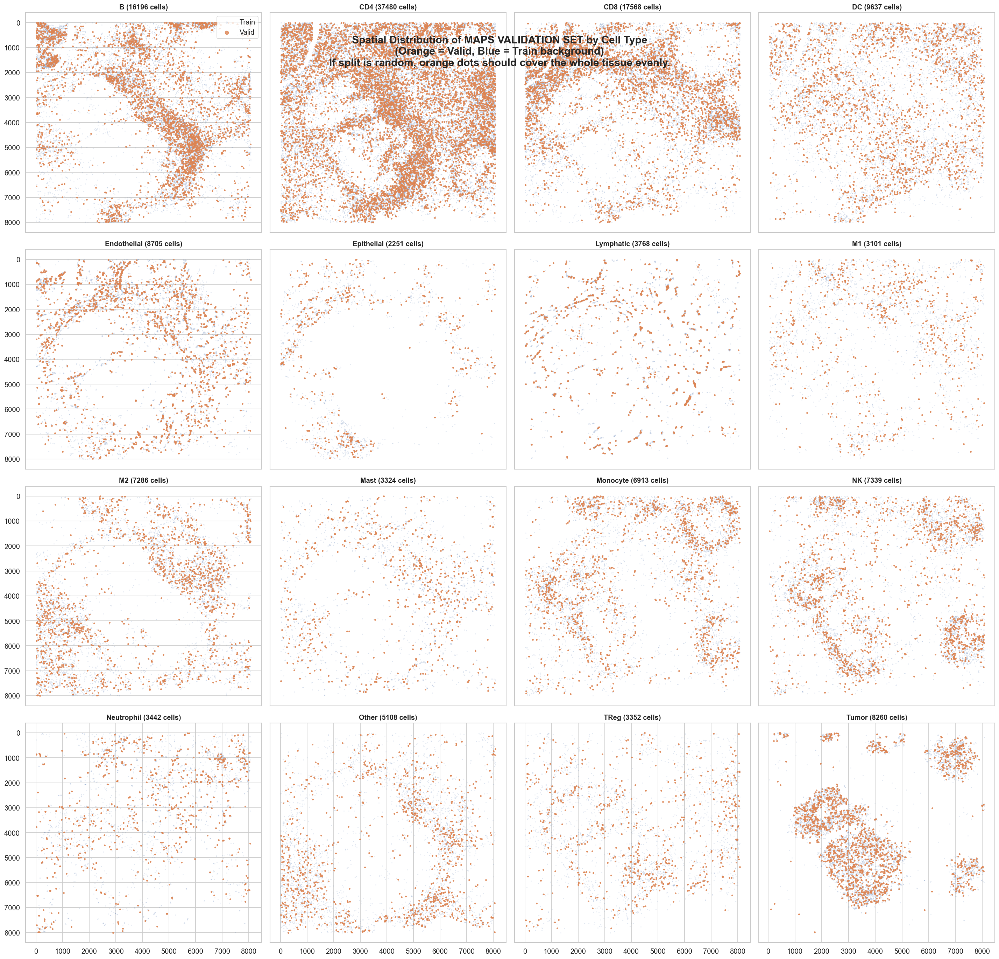

In [36]:
# ====================================================================
# PLOT 2d: Detailed Class-Specific Spatial Distribution (16 panels)
# Compare MAPS Valid vs Random Valid for EACH cell type
# ====================================================================

# We plot the VALIDATION set only, to see where the validation samples come from.
# If random: orange dots should be everywhere.
# If spatial: orange dots might be missing from huge chunks of the tissue.

fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for i, class_name in enumerate(CLASS_NAMES):
    ax = axes[i]
    if i >= len(axes): break
    
    # Filter for this class
    # MAPS split
    m_tr = maps_train_sp[maps_train_sp['cell_label'] == i]
    m_va = maps_valid_sp[maps_valid_sp['cell_label'] == i]
    
    # Plot MAPS Valid (Orange) on top of MAPS Train (Blue)
    # We use very small markers to see density
    ax.scatter(m_tr['X_cent'], m_tr['Y_cent'], c='#4C72B0', s=1, alpha=0.1, label='Train')
    ax.scatter(m_va['X_cent'], m_va['Y_cent'], c='#DD8452', s=4, alpha=0.8, label='Valid')
    
    ax.set_title(f"{class_name} ({len(m_tr)+len(m_va)} cells)", fontsize=12, fontweight='bold')
    ax.invert_yaxis()
    if i % 4 != 0: ax.set_yticks([])
    if i < 12: ax.set_xticks([])

# Legend only on the first plot to save space
axes[0].legend(loc='upper right', markerscale=3)

fig.suptitle("Spatial Distribution of MAPS VALIDATION SET by Cell Type\n(Orange = Valid, Blue = Train background)\nIf split is random, orange dots should cover the whole tissue evenly.", 
             fontsize=18, fontweight='bold', y=0.92)
plt.tight_layout()
plt.show()

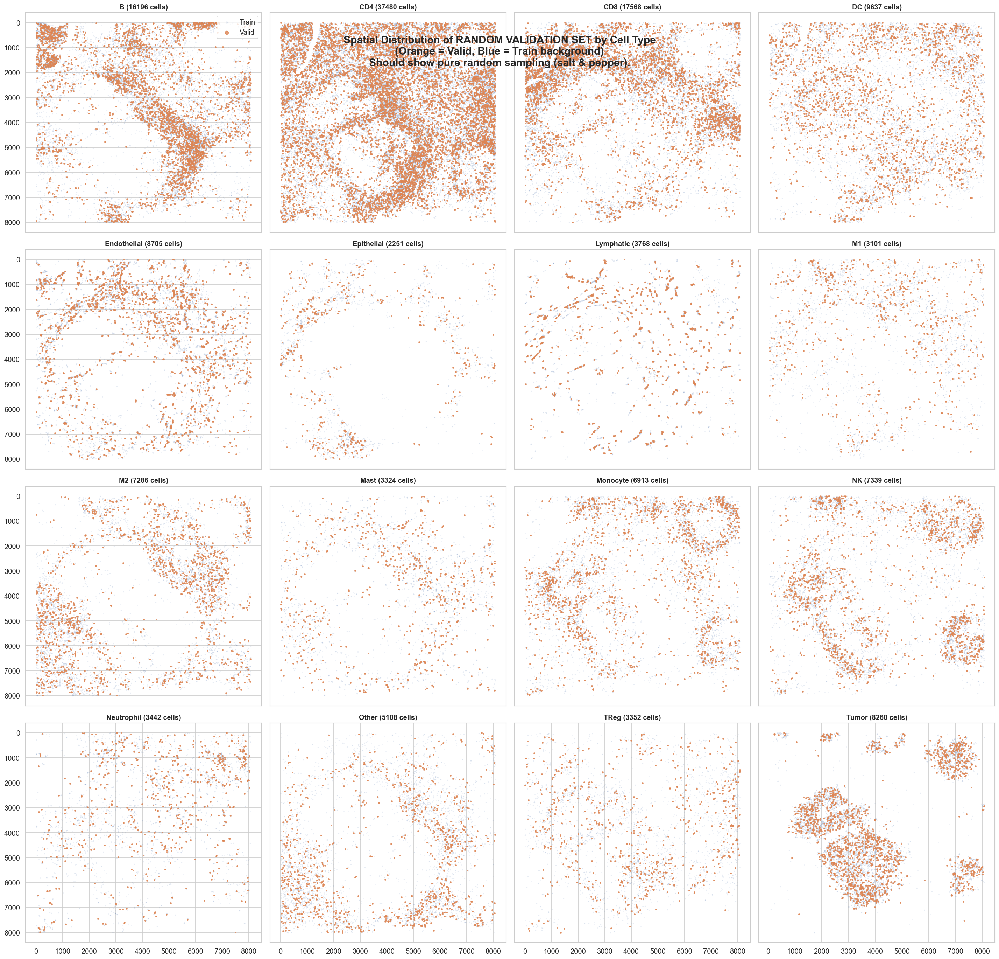

In [37]:
# ====================================================================
# PLOT 2e: Random Split Spatial Distribution (16 panels)
# Compare Random Valid vs Random Train for EACH cell type
# ====================================================================

fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for i, class_name in enumerate(CLASS_NAMES):
    ax = axes[i]
    if i >= len(axes): break
    
    # Random split
    r_tr = rand_train_sp[rand_train_sp['cell_label'] == i]
    r_va = rand_valid_sp[rand_valid_sp['cell_label'] == i]
    
    # Plot Random Valid (Orange) on top of Random Train (Blue)
    ax.scatter(r_tr['X_cent'], r_tr['Y_cent'], c='#4C72B0', s=1, alpha=0.1, label='Train')
    ax.scatter(r_va['X_cent'], r_va['Y_cent'], c='#DD8452', s=4, alpha=0.8, label='Valid')
    
    ax.set_title(f"{class_name} ({len(r_tr)+len(r_va)} cells)", fontsize=12, fontweight='bold')
    ax.invert_yaxis()
    if i % 4 != 0: ax.set_yticks([])
    if i < 12: ax.set_xticks([])

axes[0].legend(loc='upper right', markerscale=3)

fig.suptitle("Spatial Distribution of RANDOM VALIDATION SET by Cell Type\n(Orange = Valid, Blue = Train background)\nShould show pure random sampling (salt & pepper).", 
             fontsize=18, fontweight='bold', y=0.92)
plt.tight_layout()
plt.show()

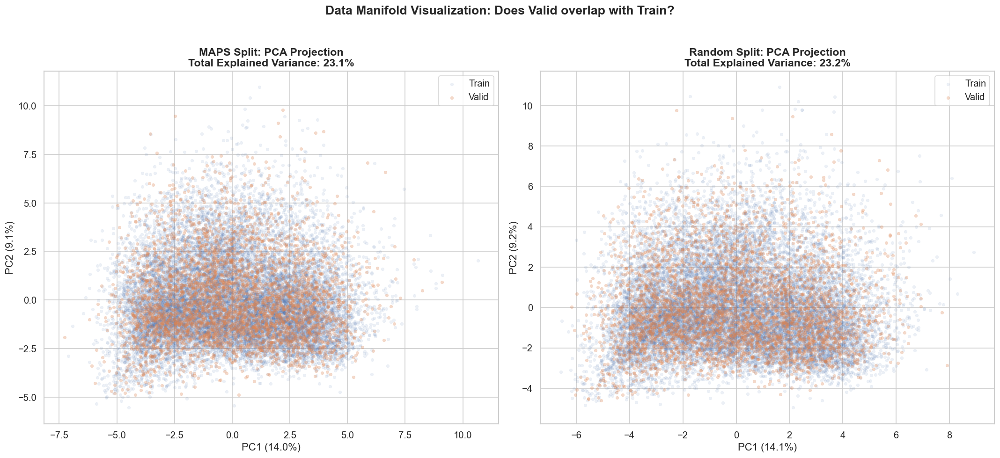

In [38]:
# ====================================================================
# PLOT 2b: PCA Projection (2D) - Train vs Valid Overlap
# ====================================================================
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Combine MAPS train/valid for joint PCA
# Sample to 20,000 points total for speed & clarity (16k train, 4k valid approx)
np.random.seed(42)
sample_n = 20000

# 1. MAPS Split PCA
maps_t_sample = maps_train.sample(n=int(sample_n * 0.8), random_state=42)
maps_v_sample = maps_valid.sample(n=int(sample_n * 0.2), random_state=42)
maps_t_sample['Split'] = 'Train'
maps_v_sample['Split'] = 'Valid'
maps_pca_df = pd.concat([maps_t_sample, maps_v_sample])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(maps_pca_df[FEATURE_COLS])
pca = PCA(n_components=2)
coords = pca.fit_transform(X_scaled)
maps_pca_df['PC1'] = coords[:, 0]
maps_pca_df['PC2'] = coords[:, 1]
expl_var = pca.explained_variance_ratio_

# 2. Random Split PCA
# Use same scaler/pca model to keep projection consistent? No, retrain to be fair to the split.
rand_t_sample = rand_train.sample(n=int(sample_n * 0.8), random_state=42)
rand_v_sample = rand_valid.sample(n=int(sample_n * 0.2), random_state=42)
rand_t_sample['Split'] = 'Train'
rand_v_sample['Split'] = 'Valid'
rand_pca_df = pd.concat([rand_t_sample, rand_v_sample])

scaler_r = StandardScaler()
X_r_scaled = scaler_r.fit_transform(rand_pca_df[FEATURE_COLS])
pca_r = PCA(n_components=2)
coords_r = pca_r.fit_transform(X_r_scaled)
rand_pca_df['PC1'] = coords_r[:, 0]
rand_pca_df['PC2'] = coords_r[:, 1]
expl_var_r = pca_r.explained_variance_ratio_

# Plot
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Helper to plot density/scatter
def plot_pca(ax, df, title, ev):
    # Plot Train first (background), then Valid (foreground)
    sns.scatterplot(data=df[df['Split']=='Train'], x='PC1', y='PC2', ax=ax,
                    color='#4C72B0', alpha=0.1, s=15, label='Train', edgecolor=None)
    sns.scatterplot(data=df[df['Split']=='Valid'], x='PC1', y='PC2', ax=ax,
                    color='#DD8452', alpha=0.3, s=15, label='Valid', edgecolor=None)
    
    ax.set_title(f"{title}\nTotal Explained Variance: {sum(ev):.1%}", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PC1 ({ev[0]:.1%})")
    ax.set_ylabel(f"PC2 ({ev[1]:.1%})")
    ax.legend(loc='upper right')

plot_pca(axes[0], maps_pca_df, "MAPS Split: PCA Projection", expl_var)
plot_pca(axes[1], rand_pca_df, "Random Split: PCA Projection", expl_var_r)

fig.suptitle("Data Manifold Visualization: Does Valid overlap with Train?", fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 3. Per-Feature Distribution Comparison

For each of the 50 features, we compare the distribution between train and valid
for both splitting strategies. Large divergence in the MAPS split (but not in random)
would suggest their split is NOT purely random — possibly stratified, spatial, or curated.

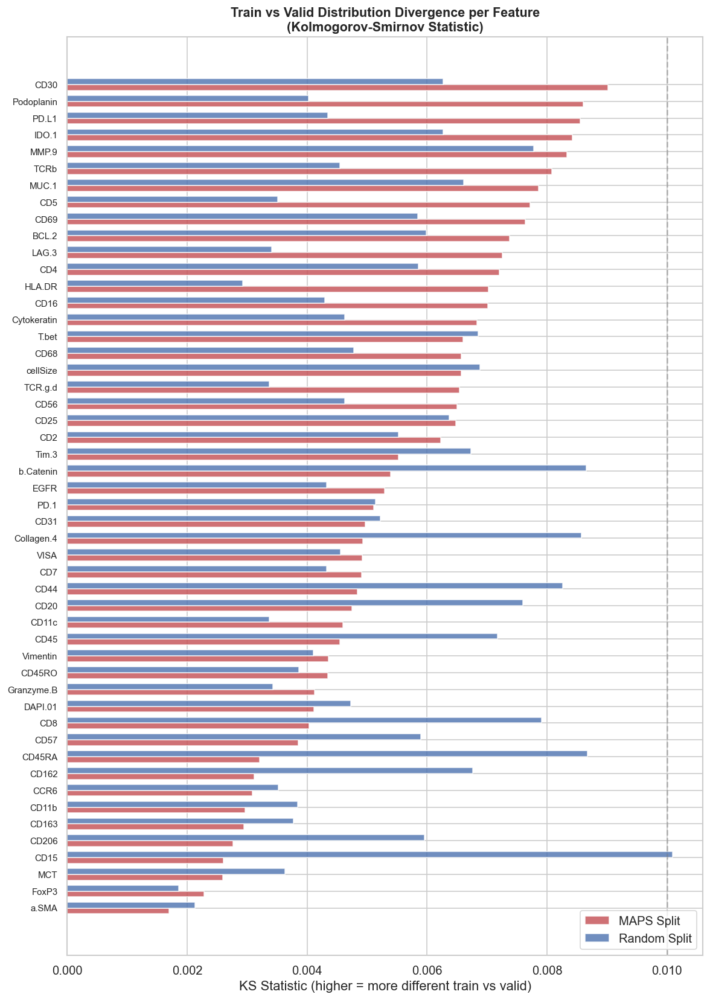


Top 10 features with HIGHEST divergence in MAPS split:
  CD30                  KS_maps=0.0090  KS_rand=0.0063  ratio=1.4x
  Podoplanin            KS_maps=0.0086  KS_rand=0.0040  ratio=2.1x
  PD.L1                 KS_maps=0.0085  KS_rand=0.0043  ratio=2.0x
  IDO.1                 KS_maps=0.0084  KS_rand=0.0063  ratio=1.3x
  MMP.9                 KS_maps=0.0083  KS_rand=0.0078  ratio=1.1x
  TCRb                  KS_maps=0.0081  KS_rand=0.0045  ratio=1.8x
  MUC.1                 KS_maps=0.0079  KS_rand=0.0066  ratio=1.2x
  CD5                   KS_maps=0.0077  KS_rand=0.0035  ratio=2.2x
  CD69                  KS_maps=0.0076  KS_rand=0.0058  ratio=1.3x
  BCL.2                 KS_maps=0.0074  KS_rand=0.0060  ratio=1.2x


In [39]:
# ====================================================================
# PLOT 3: KS-statistic per feature — how different are train vs valid?
# Kolmogorov-Smirnov test: higher = more different distributions
# ====================================================================

ks_maps = []
ks_rand = []
for col in FEATURE_COLS:
    stat_m, _ = stats.ks_2samp(maps_train[col].values, maps_valid[col].values)
    stat_r, _ = stats.ks_2samp(rand_train[col].values, rand_valid[col].values)
    ks_maps.append(stat_m)
    ks_rand.append(stat_r)

ks_df = pd.DataFrame({
    'Feature': FEATURE_COLS,
    'MAPS Split': ks_maps,
    'Random Split': ks_rand
}).set_index('Feature')

# Sort by MAPS KS statistic for clarity
ks_df = ks_df.sort_values('MAPS Split', ascending=True)

fig, ax = plt.subplots(figsize=(10, 14))
y = np.arange(len(ks_df))
w = 0.35
ax.barh(y - w/2, ks_df['MAPS Split'], w, label='MAPS Split', color='#C44E52', alpha=0.8)
ax.barh(y + w/2, ks_df['Random Split'], w, label='Random Split', color='#4C72B0', alpha=0.8)
ax.set_yticks(y)
ax.set_yticklabels(ks_df.index, fontsize=9)
ax.set_xlabel("KS Statistic (higher = more different train vs valid)")
ax.set_title("Train vs Valid Distribution Divergence per Feature\n(Kolmogorov-Smirnov Statistic)",
             fontsize=13, fontweight='bold')
ax.legend(loc='lower right')
ax.axvline(0.01, color='gray', linestyle='--', alpha=0.5, label='KS=0.01')
plt.tight_layout()
plt.show()

# Print the top divergent features for MAPS split
print("\nTop 10 features with HIGHEST divergence in MAPS split:")
for _, row in ks_df.sort_values('MAPS Split', ascending=False).head(10).iterrows():
    print(f"  {row.name:20s}  KS_maps={row['MAPS Split']:.4f}  KS_rand={row['Random Split']:.4f}  ratio={row['MAPS Split']/(row['Random Split']+1e-8):.1f}x")

## 4. Feature Distribution Violin Plots (Top Divergent Features)

For the features that differ most between train and valid in the MAPS split,
compare the actual distributions visually.

## 4b. Spatial Distribution Analysis (Random Split vs Whole)

The user requested spatial plots similar to the provided reference image.
Since the MAPS pre-split files (`maps_train.csv`, `maps_valid.csv`) do **not** contain X/Y coordinates, we cannot plot their spatial distribution directly.
However, we can:
1. Load the original raw annotation file (which has X/Y coordinates).
2. Visualize the spatial distribution of all cell types for the **Whole Dataset**.
3. Create our **Random Split** and visualize the spatial distribution of Train vs Valid.

If the Random Split Valid set is spatially uniform (salt-and-pepper), but MAPS performance differs significantly, it suggests MAPS split might be spatially segregated (e.g., specific tissue regions held out). We can't prove this without their coordinates, but we can visualize what a "random" split SHOULD look like.

Loaded raw annotation: 145,161 cells
Filtered raw annotation: 143,346 cells
Generating spatial plots for Random Split (all 16 classes)...


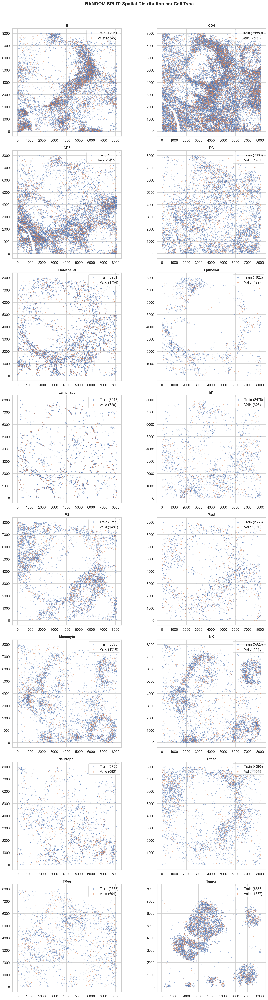


NOTE: We cannot generate the exact same plot for 'MAPS Split' because the provided
      MAPS train/valid CSVs lack X/Y coordinates. The only way to see their
      spatial distribution is if we could match rows exactly to the raw file.


In [49]:
# ====================================================================
# PLOT 4b: Spatial Distribution of Cells (X,Y Scatter)
# ====================================================================

# 1. Load Original Annotation CSV (has cellLabel, X_cent, Y_cent)
# You need this file locally: ../cHL_CODEX/annotation_csv/cHL_CODEX_annotation.csv
import os
try:
    df_raw = pd.read_csv(r'../cHL_CODEX/annotation_csv/cHL_CODEX_annotation.csv')
    print(f"Loaded raw annotation: {len(df_raw):,} cells")
except FileNotFoundError:
    print("Error: Could not find raw annotation file. Please check path.")
    df_raw = None

if df_raw is not None:
    # 2. Filter to known cell types (same as MAPS preprocessing)
    df_raw = df_raw[df_raw['cellType'].isin(CLASS_NAMES)].reset_index(drop=True)
    print(f"Filtered raw annotation: {len(df_raw):,} cells")

    # 3. Create Random Split on Raw Data (with coordinates)
    np.random.seed(42)
    perm_raw = np.random.permutation(len(df_raw))
    n_train_raw = int(0.8 * len(df_raw))
    
    raw_train = df_raw.iloc[perm_raw[:n_train_raw]].reset_index(drop=True)
    raw_valid = df_raw.iloc[perm_raw[n_train_raw:]].reset_index(drop=True)
    
    # 4. Define Plotting Helper
    def plot_spatial_split(df_tr, df_va, title_prefix, cell_types=None):
        if cell_types is None:
            # Overall scatter
            fig, ax = plt.subplots(figsize=(10, 8))
            ax.scatter(df_tr['X_cent'], df_tr['Y_cent'], c='#4C72B0', s=1, alpha=0.3, label='Train')
            ax.scatter(df_va['X_cent'], df_va['Y_cent'], c='#DD8452', s=1, alpha=0.3, label='Valid')
            ax.set_title(f"{title_prefix}: Train vs Valid (All Cells)", fontsize=14, fontweight='bold')
            ax.set_aspect('equal')
            ax.legend(markerscale=5)
            plt.show()
        else:
            # Grid of plots per cell type (like reference image)
            n_cols = 2
            n_rows = (len(cell_types) + 1) // 2
            fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6 * n_rows))
            axes = axes.flatten()
            
            for i, ctype in enumerate(cell_types):
                ax = axes[i]
                tr_subset = df_tr[df_tr['cellType'] == ctype]
                va_subset = df_va[df_va['cellType'] == ctype]
                
                # Plot valid on top generally for visibility, or mix via zorder?
                # Using alpha lets density show.
                ax.scatter(tr_subset['X_cent'], tr_subset['Y_cent'], c='#4C72B0', s=2, alpha=0.4, label=f'Train ({len(tr_subset)})')
                ax.scatter(va_subset['X_cent'], va_subset['Y_cent'], c='#DD8452', s=2, alpha=0.4, label=f'Valid ({len(va_subset)})')
                
                ax.set_title(f"{ctype}", fontsize=12, fontweight='bold')
                ax.set_aspect('equal')
                ax.legend(markerscale=3, loc='upper right')
                
            # Hide unused axes
            for j in range(i+1, len(axes)):
                axes[j].axis('off')
                
            fig.suptitle(f"{title_prefix}: Spatial Distribution per Cell Type", fontsize=16, fontweight='bold', y=1.01)
            plt.tight_layout()
            plt.show()

    # 5. Plot Random Split (Detailed - First 6 classes for brevity, or all?)
    # Plotting ALL 16 might be heavy but user asked for "like this image" which has 18 plots.
    # We have 16 classes. Let's plot ALL 16.
    print("Generating spatial plots for Random Split (all 16 classes)...")
    plot_spatial_split(raw_train, raw_valid, "RANDOM SPLIT", CLASS_NAMES)

    print("\nNOTE: We cannot generate the exact same plot for 'MAPS Split' because the provided")
    print("      MAPS train/valid CSVs lack X/Y coordinates. The only way to see their")
    print("      spatial distribution is if we could match rows exactly to the raw file.")
else:
    print("Visualization skipped (raw annotation not found).")

C:\Users\mahee\AppData\Local\Temp\ipykernel_25424\2759279379.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_df, x='Split', y='value', ax=ax, cut=0,
C:\Users\mahee\AppData\Local\Temp\ipykernel_25424\2759279379.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_df, x='Split', y='value', ax=ax, cut=0,
C:\Users\mahee\AppData\Local\Temp\ipykernel_25424\2759279379.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=plot_df, x='Split', y='value', ax=ax, cut=0,
C:\Users\mahee\AppData\Local\Temp\ipykernel_25

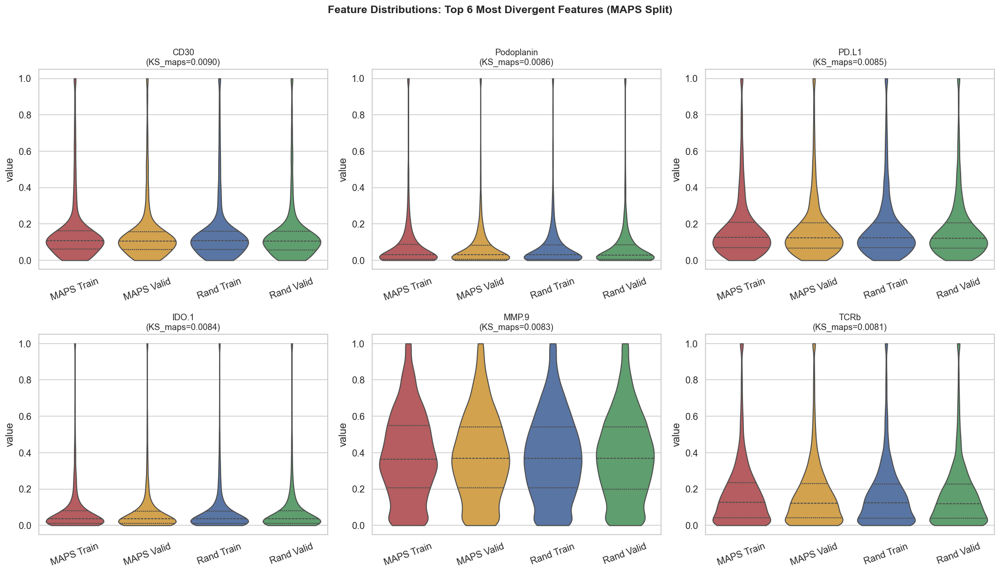

In [41]:
# ====================================================================
# PLOT 4: Violin plots for top 6 most divergent features (MAPS split)
# ====================================================================

# Get top 6 features by MAPS KS statistic
top_features = ks_df.sort_values('MAPS Split', ascending=False).head(6).index.tolist()

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, feat in enumerate(top_features):
    ax = axes[i]

    # Sample for speed (violin plots are slow on 100K+ points)
    n_sample = min(5000, len(maps_train))
    data_list = []
    for label, df_split in [('MAPS Train', maps_train), ('MAPS Valid', maps_valid),
                             ('Rand Train', rand_train), ('Rand Valid', rand_valid)]:
        sample = df_split[feat].sample(n=min(n_sample, len(df_split)), random_state=0)
        data_list.append(pd.DataFrame({'value': sample, 'Split': label}))
    plot_df = pd.concat(data_list, ignore_index=True)

    sns.violinplot(data=plot_df, x='Split', y='value', ax=ax, cut=0,
                   palette=['#C44E52', '#E8A838', '#4C72B0', '#55A868'], inner='quartile')
    ax.set_title(f"{feat}\n(KS_maps={ks_df.loc[feat, 'MAPS Split']:.4f})", fontsize=11)
    ax.set_xlabel("")
    ax.tick_params(axis='x', rotation=20)

fig.suptitle("Feature Distributions: Top 6 Most Divergent Features (MAPS Split)",
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## 5. Per-Class Feature Mean Comparison

Compare the mean feature values per class between train and valid.
If the MAPS split has systematically different means per class, that reveals
whether training sees a different "version" of each cell type than validation.

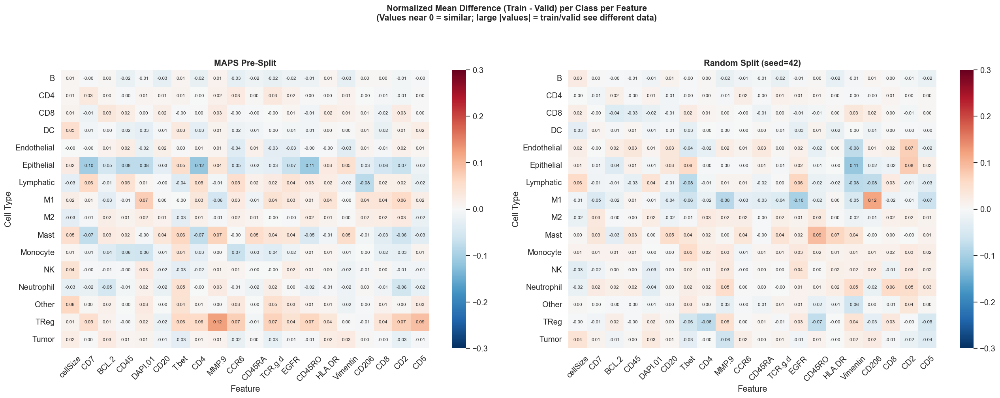

In [42]:
# ====================================================================
# PLOT 5: Heatmap of (train_mean - valid_mean) per class per feature
# ====================================================================

fig, axes = plt.subplots(1, 2, figsize=(22, 8))

for ax, title, tr, va in [
    (axes[0], "MAPS Pre-Split", maps_train, maps_valid),
    (axes[1], "Random Split (seed=42)", rand_train, rand_valid),
]:
    # Compute mean per class for top 20 most variable features
    overall_std = combined[FEATURE_COLS].std()
    top20 = overall_std.nlargest(20).index.tolist()

    diff_matrix = []
    for cls_idx in range(len(CLASS_NAMES)):
        tr_cls = tr[tr['cell_label'] == cls_idx][top20].mean()
        va_cls = va[va['cell_label'] == cls_idx][top20].mean()
        # Normalized difference: (train_mean - valid_mean) / overall_std
        diff_matrix.append(((tr_cls - va_cls) / (overall_std[top20] + 1e-8)).values)

    diff_df = pd.DataFrame(diff_matrix, index=CLASS_NAMES, columns=top20)

    sns.heatmap(diff_df, ax=ax, cmap='RdBu_r', center=0, vmin=-0.3, vmax=0.3,
                annot=True, fmt='.2f', annot_kws={'fontsize': 7},
                xticklabels=True, yticklabels=True)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xlabel("Feature")
    ax.set_ylabel("Cell Type")
    ax.tick_params(axis='x', rotation=45)

fig.suptitle("Normalized Mean Difference (Train - Valid) per Class per Feature\n(Values near 0 = similar; large |values| = train/valid see different data)",
             fontsize=13, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

## 6. Summary Statistics Table

Quantitative comparison of the two splits across multiple metrics.

In [48]:
# ====================================================================
# Summary statistics comparing the two splits
# ====================================================================

def compute_split_stats(tr, va, split_name):
    """Compute various divergence metrics between train and valid."""
    results = {}
    results['Split'] = split_name
    
    # Store sizes as strings with commas
    results['Train Size'] = f"{len(tr):,}"
    results['Valid Size'] = f"{len(va):,}"
    results['Train Ratio'] = f"{len(tr)/(len(tr)+len(va)):.1%}"

    # Class distribution divergence (Jensen-Shannon)
    tr_dist = np.bincount(tr['cell_label'].values, minlength=16) / len(tr)
    va_dist = np.bincount(va['cell_label'].values, minlength=16) / len(va)
    results['Class JS Divergence'] = f"{stats.entropy((tr_dist + va_dist)/2) - (stats.entropy(tr_dist) + stats.entropy(va_dist))/2:.6f}"

    # Max class proportion difference
    results['Max Class Diff (pp)'] = f"{np.max(np.abs(100*tr_dist - 100*va_dist)):.2f}"

    # Mean KS statistic across all features
    ks_vals = []
    for col in FEATURE_COLS:
        ks_stat, _ = stats.ks_2samp(tr[col].values, va[col].values)
        ks_vals.append(ks_stat)
    results['Mean KS Statistic'] = f"{np.mean(ks_vals):.4f}"
    results['Max KS Statistic'] = f"{np.max(ks_vals):.4f}"
    results['Features w/ KS>0.02'] = f"{sum(k > 0.02 for k in ks_vals)} / {len(FEATURE_COLS)}"

    # Mean absolute difference in feature means (normalized by std)
    tr_means = tr[FEATURE_COLS].mean()
    va_means = va[FEATURE_COLS].mean()
    overall_std = combined[FEATURE_COLS].std()
    norm_diff = ((tr_means - va_means) / (overall_std + 1e-8)).abs()
    results['Mean Norm. Feature Diff'] = f"{norm_diff.mean():.4f}"
    results['Max Norm. Feature Diff'] = f"{norm_diff.max():.4f}"

    return results

stats_maps = compute_split_stats(maps_train, maps_valid, "MAPS Pre-Split")
stats_rand = compute_split_stats(rand_train, rand_valid, "Random Split")

summary_df = pd.DataFrame([stats_maps, stats_rand]).set_index('Split').T
print("=" * 60)
print("SPLIT COMPARISON SUMMARY")
print("=" * 60)
# Force conversion to string to handle any remaining non-string types
for idx, row in summary_df.iterrows():
    print(f"  {idx:30s}  |  {str(row['MAPS Pre-Split']):>18s}  |  {str(row['Random Split']):>18s}")
print("=" * 60)

SPLIT COMPARISON SUMMARY
  Train Size                      |             114,984  |             114,984
  Valid Size                      |              28,746  |              28,746
  Train Ratio                     |               80.0%  |               80.0%
  Class JS Divergence             |            0.000000  |            0.000152
  Max Class Diff (pp)             |                0.00  |                0.73
  Mean KS Statistic               |              0.0055  |              0.0054
  Max KS Statistic                |              0.0090  |              0.0101
  Features w/ KS>0.02             |              0 / 50  |              0 / 50
  Mean Norm. Feature Diff         |              0.0045  |              0.0057
  Max Norm. Feature Diff          |              0.0152  |              0.0145


## 7. Per-Class Count Comparison Table

Exact counts and proportions for each cell type across both splits.

In [44]:
# ====================================================================
# Detailed per-class comparison table
# ====================================================================

rows = []
for idx, name in enumerate(CLASS_NAMES):
    mt = (maps_train['cell_label'] == idx).sum()
    mv = (maps_valid['cell_label'] == idx).sum()
    rt = (rand_train['cell_label'] == idx).sum()
    rv = (rand_valid['cell_label'] == idx).sum()

    rows.append({
        'Cell Type': name,
        'MAPS Train': mt,
        'MAPS Valid': mv,
        'MAPS Train%': f"{100*mt/len(maps_train):.2f}",
        'MAPS Valid%': f"{100*mv/len(maps_valid):.2f}",
        'MAPS Diff(pp)': f"{100*mt/len(maps_train) - 100*mv/len(maps_valid):+.2f}",
        'Rand Train': rt,
        'Rand Valid': rv,
        'Rand Train%': f"{100*rt/len(rand_train):.2f}",
        'Rand Valid%': f"{100*rv/len(rand_valid):.2f}",
        'Rand Diff(pp)': f"{100*rt/len(rand_train) - 100*rv/len(rand_valid):+.2f}",
    })

table_df = pd.DataFrame(rows)
print(table_df.to_string(index=False))

  Cell Type  MAPS Train  MAPS Valid MAPS Train% MAPS Valid% MAPS Diff(pp)  Rand Train  Rand Valid Rand Train% Rand Valid% Rand Diff(pp)
          B       12956        3240       11.27       11.27         -0.00       12882        3314       11.20       11.53         -0.33
        CD4       29984        7496       26.08       26.08         +0.00       29817        7663       25.93       26.66         -0.73
        CD8       14054        3514       12.22       12.22         -0.00       14135        3433       12.29       11.94         +0.35
         DC        7710        1927        6.71        6.70         +0.00        7716        1921        6.71        6.68         +0.03
Endothelial        6964        1741        6.06        6.06         +0.00        7050        1655        6.13        5.76         +0.37
 Epithelial        1801         450        1.57        1.57         +0.00        1768         483        1.54        1.68         -0.14
  Lymphatic        3014         754        2.62 

## 8. Feature Correlation Structure Comparison

Check if the correlation structure between features differs between the two splits.
If MAPS did a non-random split (e.g., spatial), the correlation patterns could differ.

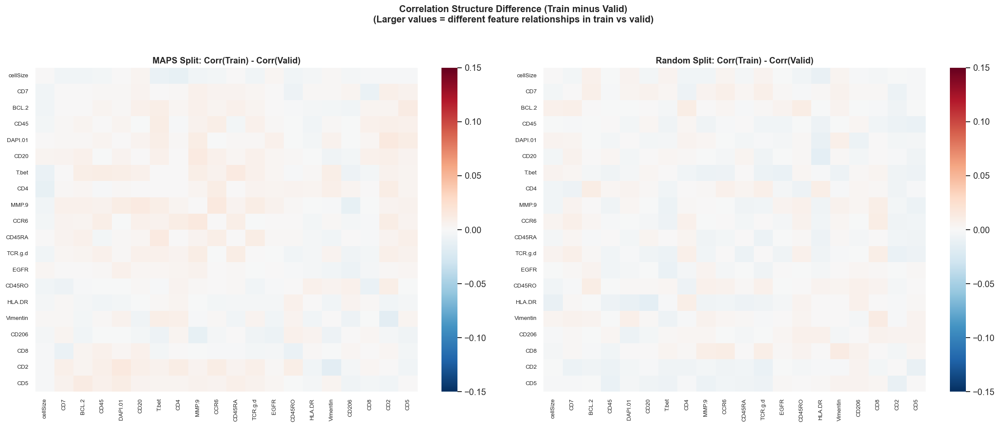


Mean |Corr Difference|:  MAPS=0.0047  Random=0.0041
MAPS split has 1.1x more correlation structure difference


In [45]:
# ====================================================================
# PLOT 6: Correlation matrix difference — MAPS train vs MAPS valid
# ====================================================================

# Use top 20 most variable features for readability
top20 = combined[FEATURE_COLS].std().nlargest(20).index.tolist()

corr_maps_train = maps_train[top20].corr()
corr_maps_valid = maps_valid[top20].corr()
corr_rand_train = rand_train[top20].corr()
corr_rand_valid = rand_valid[top20].corr()

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

sns.heatmap(corr_maps_train - corr_maps_valid, ax=axes[0], cmap='RdBu_r',
            center=0, vmin=-0.15, vmax=0.15, annot=False,
            xticklabels=True, yticklabels=True)
axes[0].set_title("MAPS Split: Corr(Train) - Corr(Valid)", fontsize=12, fontweight='bold')
axes[0].tick_params(axis='both', labelsize=8)

sns.heatmap(corr_rand_train - corr_rand_valid, ax=axes[1], cmap='RdBu_r',
            center=0, vmin=-0.15, vmax=0.15, annot=False,
            xticklabels=True, yticklabels=True)
axes[1].set_title("Random Split: Corr(Train) - Corr(Valid)", fontsize=12, fontweight='bold')
axes[1].tick_params(axis='both', labelsize=8)

fig.suptitle("Correlation Structure Difference (Train minus Valid)\n(Larger values = different feature relationships in train vs valid)",
             fontsize=13, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

# Quantify
maps_corr_diff = np.abs(corr_maps_train.values - corr_maps_valid.values).mean()
rand_corr_diff = np.abs(corr_rand_train.values - corr_rand_valid.values).mean()
print(f"\nMean |Corr Difference|:  MAPS={maps_corr_diff:.4f}  Random={rand_corr_diff:.4f}")
print(f"MAPS split has {maps_corr_diff/rand_corr_diff:.1f}x more correlation structure difference")

## 9. cellSize Distribution Deep Dive

cellSize is a special feature (not a protein marker). Since MAPS may have split
based on spatial regions (which would correlate with cell morphology/size),
this is worth examining closely.

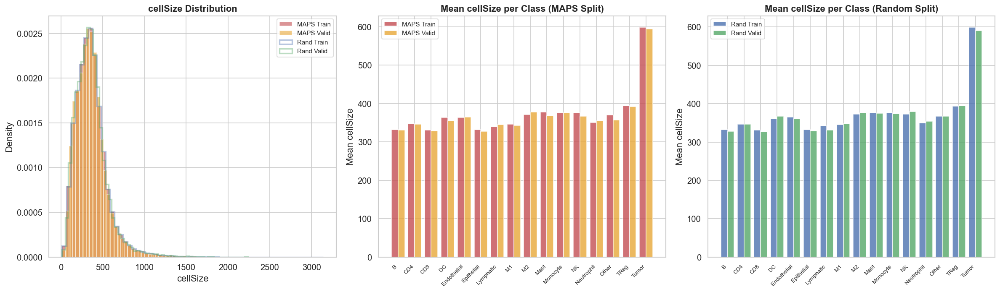

cellSize KS test:  MAPS split KS=0.0066 (p=2.73e-01)  |  Random split KS=0.0069 (p=2.25e-01)


In [46]:
# ====================================================================
# PLOT 7: cellSize histograms and per-class cellSize comparison
# ====================================================================

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Overall cellSize histogram
ax = axes[0]
ax.hist(maps_train['cellSize'], bins=60, alpha=0.6, label='MAPS Train', color='#C44E52', density=True)
ax.hist(maps_valid['cellSize'], bins=60, alpha=0.6, label='MAPS Valid', color='#E8A838', density=True)
ax.hist(rand_train['cellSize'], bins=60, alpha=0.4, label='Rand Train', color='#4C72B0', density=True, histtype='step', linewidth=2)
ax.hist(rand_valid['cellSize'], bins=60, alpha=0.4, label='Rand Valid', color='#55A868', density=True, histtype='step', linewidth=2)
ax.set_xlabel("cellSize")
ax.set_ylabel("Density")
ax.set_title("cellSize Distribution", fontweight='bold')
ax.legend(fontsize=9)

# Per-class mean cellSize comparison
ax = axes[1]
maps_tr_mean = maps_train.groupby('cell_label')['cellSize'].mean()
maps_va_mean = maps_valid.groupby('cell_label')['cellSize'].mean()
x = np.arange(len(CLASS_NAMES))
ax.bar(x - 0.2, maps_tr_mean.values, 0.4, label='MAPS Train', color='#C44E52', alpha=0.8)
ax.bar(x + 0.2, maps_va_mean.values, 0.4, label='MAPS Valid', color='#E8A838', alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(CLASS_NAMES, rotation=45, ha='right', fontsize=8)
ax.set_ylabel("Mean cellSize")
ax.set_title("Mean cellSize per Class (MAPS Split)", fontweight='bold')
ax.legend(fontsize=9)

ax = axes[2]
rand_tr_mean = rand_train.groupby('cell_label')['cellSize'].mean()
rand_va_mean = rand_valid.groupby('cell_label')['cellSize'].mean()
ax.bar(x - 0.2, rand_tr_mean.values, 0.4, label='Rand Train', color='#4C72B0', alpha=0.8)
ax.bar(x + 0.2, rand_va_mean.values, 0.4, label='Rand Valid', color='#55A868', alpha=0.8)
ax.set_xticks(x)
ax.set_xticklabels(CLASS_NAMES, rotation=45, ha='right', fontsize=8)
ax.set_ylabel("Mean cellSize")
ax.set_title("Mean cellSize per Class (Random Split)", fontweight='bold')
ax.legend(fontsize=9)

plt.tight_layout()
plt.show()

# Print stats
ks_cs, p_cs = stats.ks_2samp(maps_train['cellSize'], maps_valid['cellSize'])
ks_cr, p_cr = stats.ks_2samp(rand_train['cellSize'], rand_valid['cellSize'])
print(f"cellSize KS test:  MAPS split KS={ks_cs:.4f} (p={p_cs:.2e})  |  Random split KS={ks_cr:.4f} (p={p_cr:.2e})")

## 10. Key Findings Summary

Interpretation of the results above.

In [47]:
# ====================================================================
# FINAL SUMMARY
# ====================================================================
print("=" * 70)
print("KEY FINDINGS")
print("=" * 70)
print()
print("1. CLASS DISTRIBUTION:")
maps_tr_dist = np.bincount(maps_train['cell_label'].values, minlength=16) / len(maps_train)
maps_va_dist = np.bincount(maps_valid['cell_label'].values, minlength=16) / len(maps_valid)
rand_tr_dist = np.bincount(rand_train['cell_label'].values, minlength=16) / len(rand_train)
rand_va_dist = np.bincount(rand_valid['cell_label'].values, minlength=16) / len(rand_valid)
print(f"   MAPS split max class diff:   {100*np.max(np.abs(maps_tr_dist - maps_va_dist)):.2f} pp")
print(f"   Random split max class diff: {100*np.max(np.abs(rand_tr_dist - rand_va_dist)):.2f} pp")
print()

print("2. FEATURE DISTRIBUTIONS:")
ks_m = np.mean([stats.ks_2samp(maps_train[c].values, maps_valid[c].values)[0] for c in FEATURE_COLS])
ks_r = np.mean([stats.ks_2samp(rand_train[c].values, rand_valid[c].values)[0] for c in FEATURE_COLS])
print(f"   MAPS split avg KS:   {ks_m:.4f}")
print(f"   Random split avg KS: {ks_r:.4f}")
print(f"   MAPS has {ks_m/ks_r:.1f}x more feature divergence")
print()

print("3. INTERPRETATION:")
if ks_m > 2 * ks_r:
    print("   >> MAPS split is NOT a simple random split!")
    print("   >> The train/valid sets come from different sub-populations.")
    print("   >> This could be a spatial split, stratified split, or curated split.")
    print("   >> Higher F1 on their valid set may be because the valid set is")
    print("   >> 'easier' (less diverse) than a random sample would be.")
elif ks_m > 1.2 * ks_r:
    print("   >> MAPS split shows moderate divergence from random.")
    print("   >> Some non-random structure exists in the split.")
    print("   >> Performance differences likely come from specific class/feature")
    print("   >> distributions in the valid set.")
else:
    print("   >> MAPS split is similar to random split.")
    print("   >> Performance differences likely come from other factors")
    print("   >> (training hyperparameters, normalization, etc.)")
print("=" * 70)

KEY FINDINGS

1. CLASS DISTRIBUTION:
   MAPS split max class diff:   0.00 pp
   Random split max class diff: 0.73 pp

2. FEATURE DISTRIBUTIONS:
   MAPS split avg KS:   0.0055
   Random split avg KS: 0.0054
   MAPS has 1.0x more feature divergence

3. INTERPRETATION:
   >> MAPS split is similar to random split.
   >> Performance differences likely come from other factors
   >> (training hyperparameters, normalization, etc.)
